In [1]:
# Test the ETH class
import matplotlib.pyplot as plt
%matplotlib inline
import os, sys, cv2
os.chdir('/root/data/')   #Switch the working directory to py-faster-rcnn
sys.path.append('/root/py-faster-rcnn/lib')
from datasets import INRIA  #Modify this line to import your own imdb class
import random
print "now in",os.getcwd()

now in /root/data


In [2]:
#Initalize the customized imdb class
version = "person_class_only"
image_set = "trainval" #training plus validation
INRIA_imdb = INRIA.INRIA(version, image_set)

['00', '01']
2573 images on training process


In [3]:
#A function that renders image with bounding boxes
def render_image(images_path, boxes):
    i
    im = cv2.imread(images_path)[:, :, (2, 1, 0)]
    fig, ax = plt.subplots(figsize=(12, 12))
    ax.imshow(im, aspect='equal')
    
    
    for box in boxes:
        x1 = box[0]
        y1 = box[1]
        x2 = box[2]
        y2 = box[3]
        width = x2 - x1
        height = y2 - y1
        rectangle = plt.Rectangle((x1,y1), width, height, fill=False, edgecolor="green", linewidth=3.5)
        ax.add_patch(rectangle)
        ax.text(x1, y1 - 2, "person",
                bbox=dict(facecolor="green", alpha=0.5),
                fontsize=14, color='white')
        
    image_name = os.path.basename(image_path)
    ax.set_title(image_name)  
    plt.axis('off')
    plt.tight_layout()
    plt.draw()

['00', '01']
2573 images on training process
obj# = 3
{'seg_areas': array([ 32836.48828125,  27291.24023438,  27080.08984375], dtype=float32), 'boxes': array([[288, 199, 404, 482],
       [126, 232, 231, 490],
       [241, 221, 347, 478]], dtype=uint32), 'flipped': False, 'gt_classes': array([1, 1, 1], dtype=int32), 'gt_overlaps': <3x2 sparse matrix of type '<type 'numpy.float32'>'
	with 3 stored elements in Compressed Sparse Row format>}
obj# = 2
{'seg_areas': array([ 5516.95996094,  6822.81005859], dtype=float32), 'boxes': array([[244, 207, 292, 323],
       [310, 195, 363, 324]], dtype=uint32), 'flipped': False, 'gt_classes': array([1, 1], dtype=int32), 'gt_overlaps': <2x2 sparse matrix of type '<type 'numpy.float32'>'
	with 2 stored elements in Compressed Sparse Row format>}
obj# = 6
{'seg_areas': array([ 31232.16015625,  21313.43945312,  22067.83984375,  21689.        ,
        22067.83984375,  20572.16015625], dtype=float32), 'boxes': array([[197, 181, 311, 457],
       [354, 211

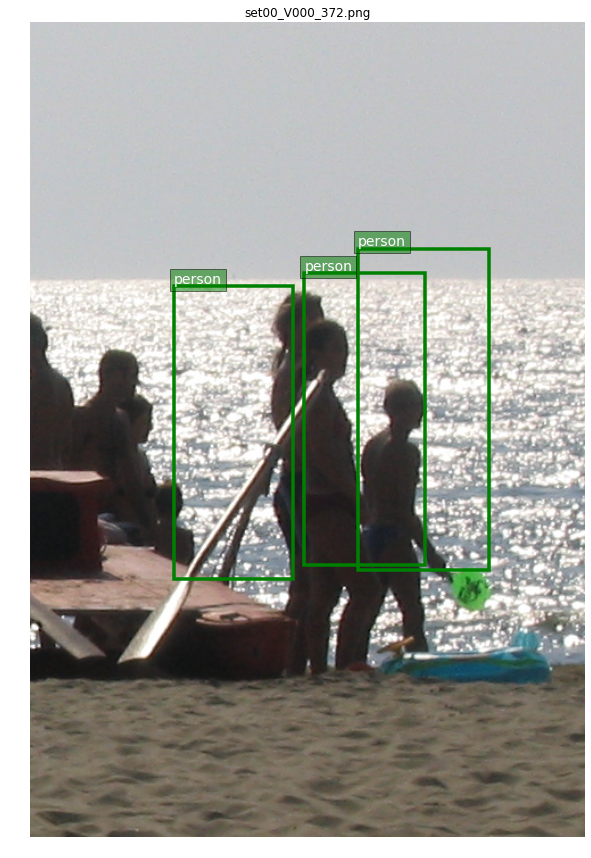

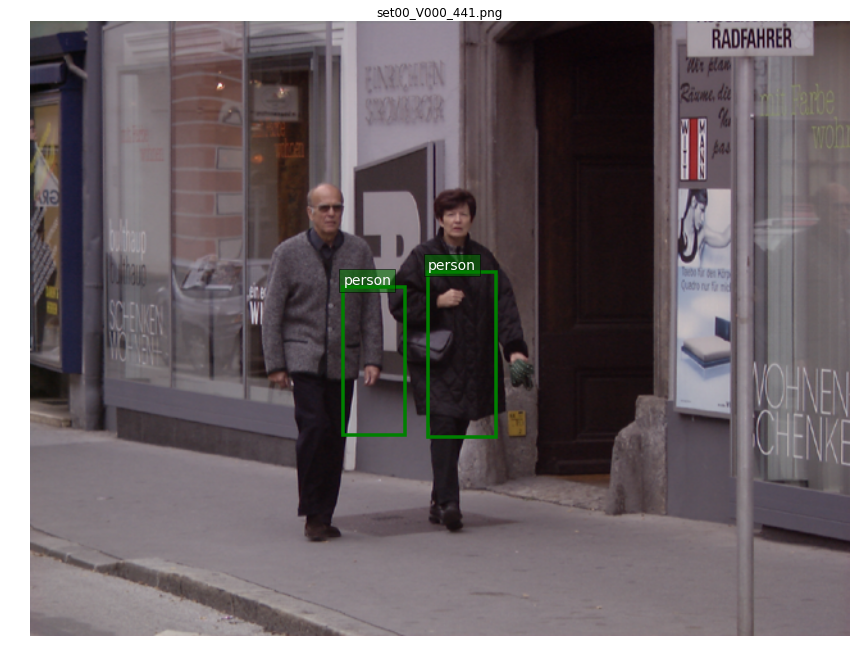

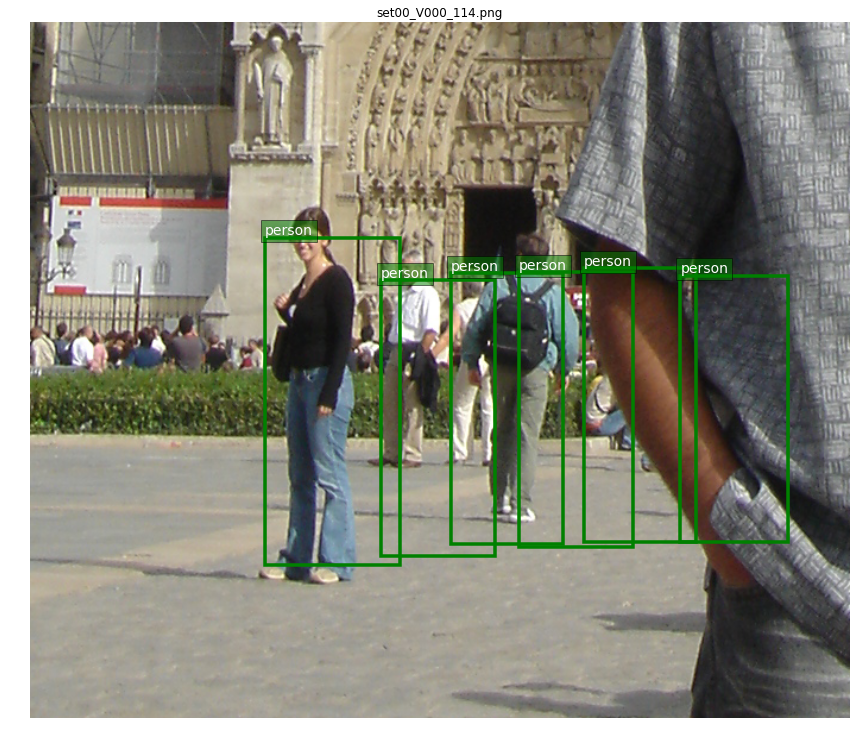

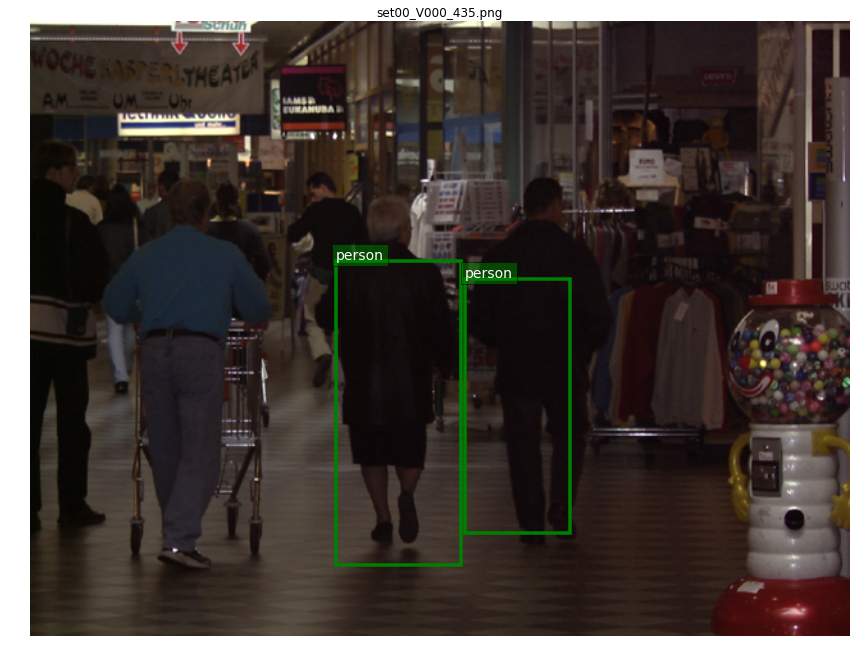

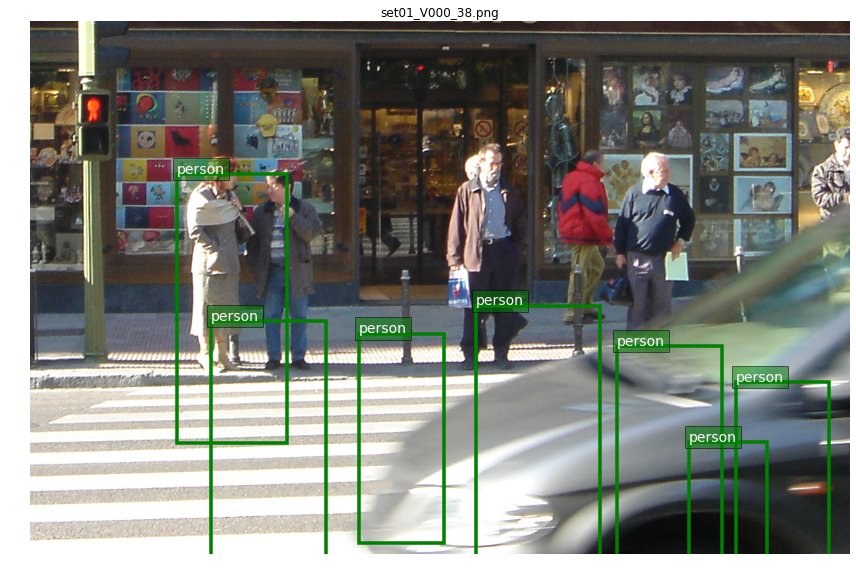

...

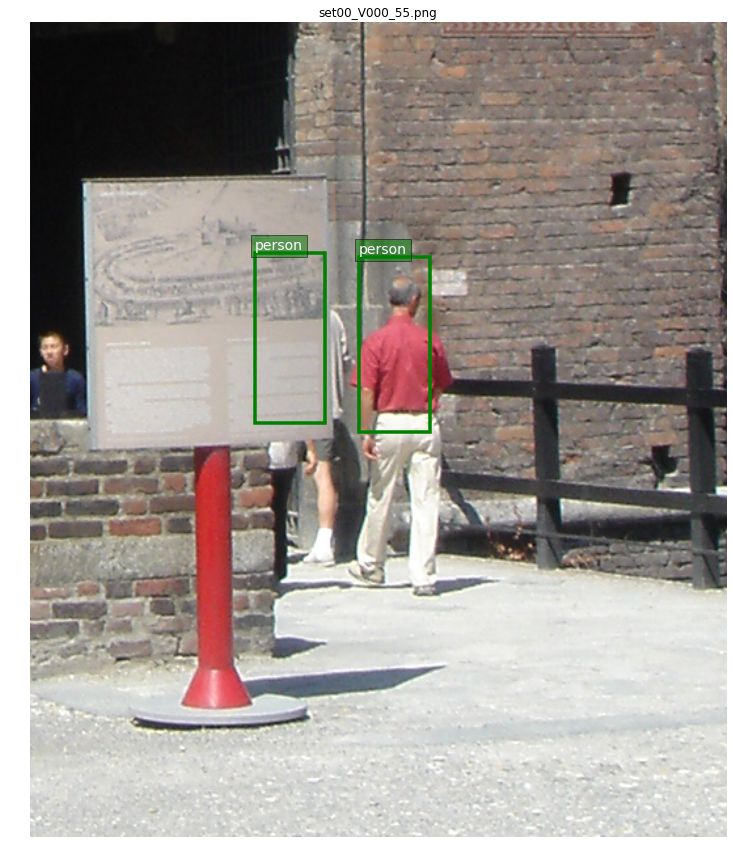

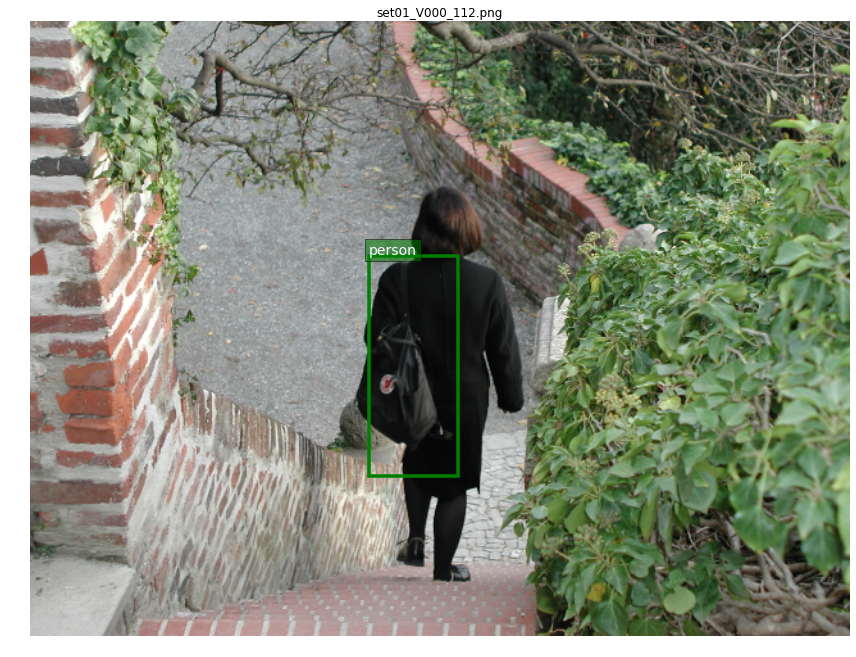

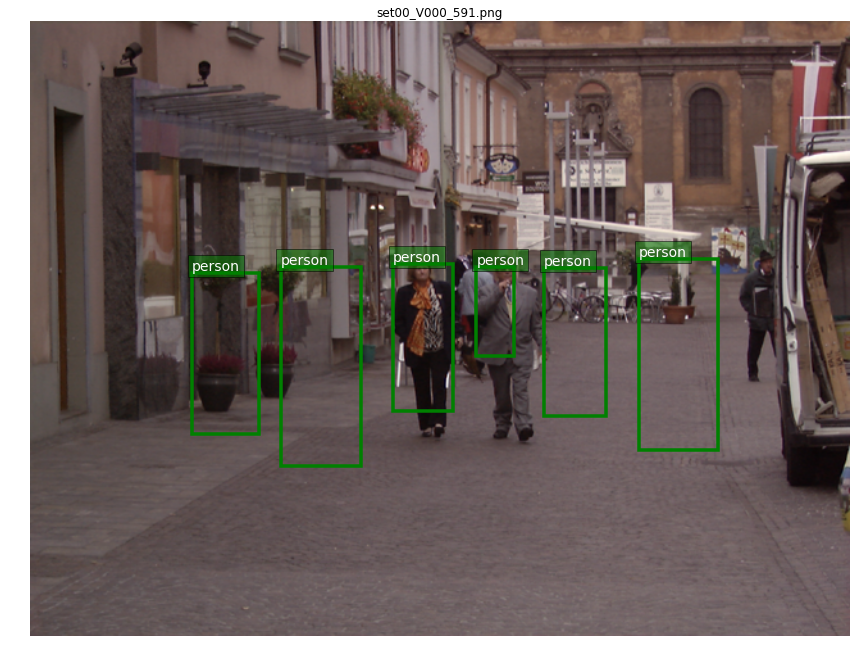

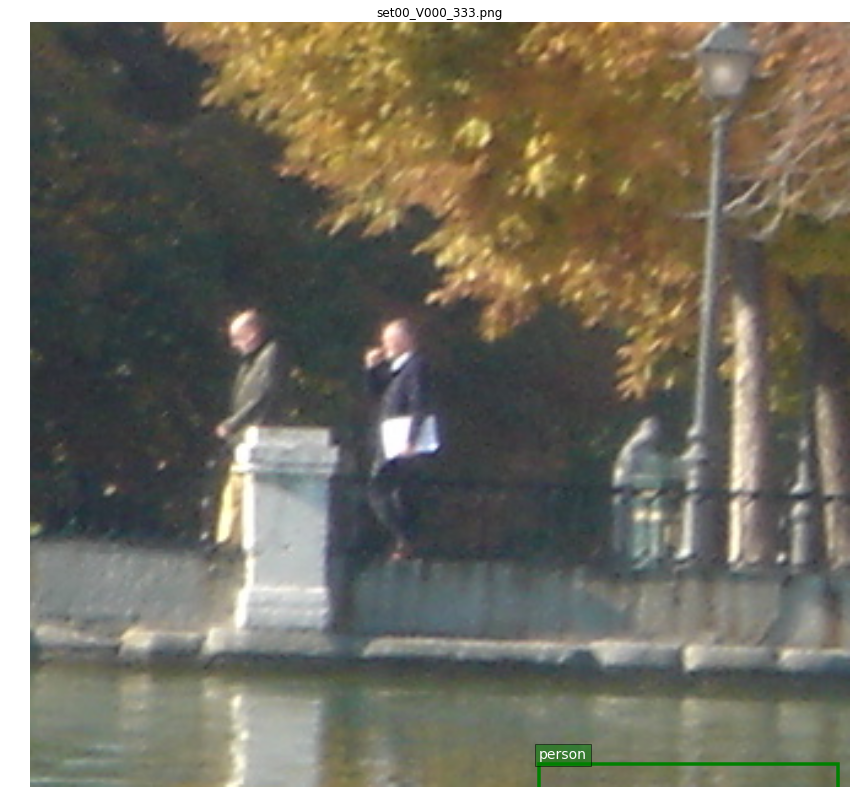

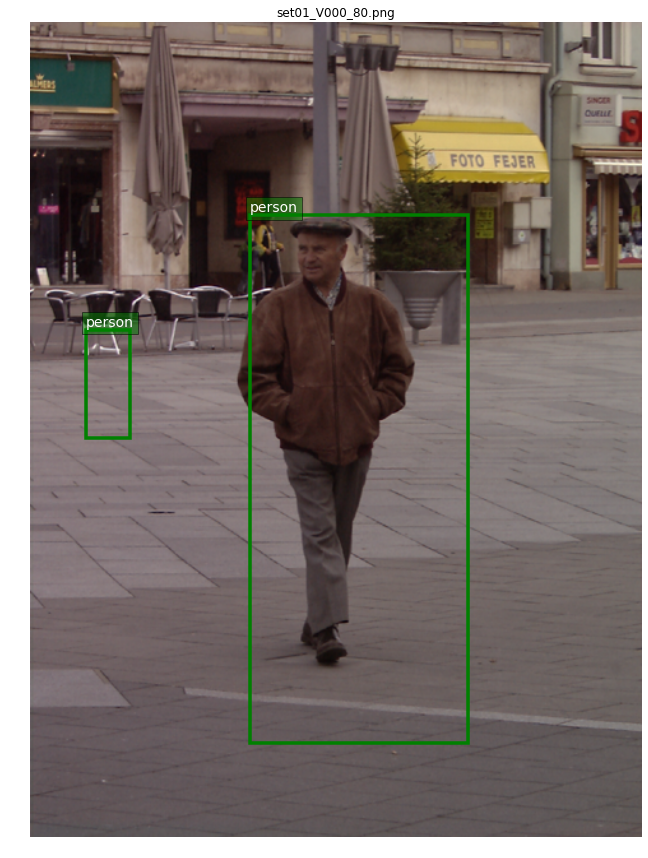

In [4]:
#Reandom select N images and their annotations
N = 50
image_names = INRIA_imdb._load_image_set_index()
sampled_indices =  random.sample(range(len(image_names)) ,N)

#Render the selected images
for i in range(N):
    sampled_index = sampled_indices[i]
    image_name = image_names[sampled_index]
    #print "image_name",image_name
    setname,vname,nframe = image_name.split("_")
    if vname == "V001":
        continue
    image_path = INRIA_imdb.image_path_at(sampled_index)
    #print image_path
    annotation = INRIA_imdb._load_caltech_annotation(image_name)
    print annotation
    boxes = annotation['boxes']
    render_image(image_path, boxes)